# FlowEmbedder: Snake Test Case

This line was written in colab. did it push to github?

In [ ]:
import torch
from torch import nn
from torch import sparse
import torch.nn.functional as F
# import torch_geometric
from tqdm import trange
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
def diffusion_matrix_from_graph(A = None, G = None, self_loops=5):
  """
  Given directed adjacency matrix (sparse or unsparse), returns sparse diffusion matrix.
  Accepts tensor inputs of `A`, in COO sparse form, or dense, or can work directly from a PyG graph, given via argument `G`.
  """
  if G is not None:
    # We were given a graph. Extract the indices and values from it:
    A = torch.sparse_coo_tensor(G.edge_index, torch.ones(G.num_edges),(G.num_nodes,G.num_nodes) )
  if A is not None:
    # check if A is sparse
    if not A.is_sparse:
      A = A.to_sparse()
    if self_loops > 0:
      A = A + (self_loops * torch.eye(A.shape[0])).to_sparse()
    # We now have a sparse tensor: get row sums and set zeros equal to one
    # this prevents division by zero errors
    degree = sparse.sum(A, dim=[1]).to_dense()
    degree[degree == 0] = 1
    one_over_degree = 1 / degree
    D_negative_one = torch.diag(one_over_degree).to_sparse()
    # Row normalize by multiplying with a diagonal matrix
    P = D_negative_one @ A
    return P

In [ ]:
def affinity_from_flow(flows, directions_array, flow_strength = 1, sigma=1):
  """Compute probabilities of transition in the given directions based on the flow. 

  Parameters
  ----------
  flows : torch tensor of shape n_points x n_dims
      _description_
  directions_array : torch tensor of shape n_directions x n_points x n_dims. Assumed to be normalized.
      _description_
  sigma : int, optional
      kernel bandwidth, by default 1
  returns (n_points)
  """
  assert len(flows.shape) == 2 # flows should only have one dimension
  assert len(directions_array.shape) > 1 and len(directions_array.shape) < 4
  n_directions = directions_array.shape[0]
  # Normalize directions
  length_of_directions = torch.linalg.norm(directions_array,dim=-1)
  normed_directions = F.normalize(directions_array,dim=-1)
  # and normalize flows # TODO: Perhaps reconsider
  # Calculate flow lengths, used to scale directions to flow
  flow_lengths = torch.linalg.norm(flows,dim=-1)
  if len(directions_array) == 1: # convert to 2d array if necessary
    directions_array = directions_array[:,None] 
  # scale directions to have same norm as flow
  # scaled_directions = normed_directions * flow_lengths[:,None].repeat(directions_array.shape[0],1,directions_array.shape[2])
  # compute dot products as matrix multiplication
  dot_products = (normed_directions * flows).sum(-1)
  # take distance between flow projected onto direction and the direction
  distance_from_flow = (torch.linalg.norm(flows,dim=1)).repeat(n_directions,1) - dot_products
  # take absolute value
  distance_from_flow = torch.abs(distance_from_flow)
  # print('shape of dff',distance_from_flow.shape)
  # add to this the length of each direction
  distance_from_flow = flow_strength*distance_from_flow + length_of_directions
  # put the points on rows, directions in columns
  distance_from_flow = distance_from_flow.T
  # take kernel of distances
  kernel =  torch.exp(-distance_from_flow/sigma)
  # normalize kernel
  # kernel /= torch.sum(kernel,axis=1)
  return kernel

In [ ]:
def affinity_matrix_from_pointset_to_pointset(pointset1, pointset2, flows,n_neighbors=None,sigma=0.5, flow_strength=1):
  """Compute affinity matrix between the points of pointset1 and pointset2, using the provided flow.

  Parameters
  ----------
  pointset1 : torch tensor, n1 x d
      The first pointset, to calculate affinities *from*
  pointset2 : torch tensor, n2 x d
      The second pointset, to calculate affinities *to* (from pointset1)
  flow : a function that, when called at a point, gives the flow at that point
  n_neighbors : number of neighbors to include in affinity computations. All neighbors beyond it are given affinity zero
  (currently not implemented)

  Returns:
  Affinity matrix: torch tensor of shape n1 x n2
  """
  # Calculate the directions from point i in pointset 1 to point j in pointset 2
  n1 = pointset1.shape[0]
  n2 = pointset2.shape[0]
  P2 = pointset2[:,:,None].repeat(1,1,n1)
  P1 = pointset1.T.repeat(n2,1,1)
  P3 = (P2 - P1)
  P3 = P3.transpose(1,2)
  # compute affinities from flows and directions
  affinities = affinity_from_flow(flows,P3,sigma=sigma,flow_strength=flow_strength)
  return affinities

In [ ]:
class GaussianVectorField(nn.Module):
  def __init__(self,n_dims, n_gaussians, device):
    super(GaussianVectorField, self).__init__()
    self.n_dims = n_dims
    # each gaussian has a mean and a variance, which are initialized randomly, but
    # are afterwards tuned by the network
    self.means = torch.nn.Parameter(torch.rand(n_gaussians,n_dims)*8 - 4).to(device)
    vecs = torch.randn(n_gaussians,n_dims)
    
    vecs = vecs / torch.linalg.norm(vecs, dim=1)[:,None]
    self.vectors = torch.nn.Parameter(vecs).to(device)
  def forward(self,points):
    # evaluates the vector field at each point
    # First, take distances between the points and the means
    dist_between_pts_and_means = torch.cdist(points,self.means)
    # print("distances between points and means",dist_between_pts_and_means)
    # apply kernel to this
    # creates n_points x n_means array
    kernel_from_mean = torch.exp(-(dist_between_pts_and_means**2))
    # print("kernalized",kernel_from_mean)
    # multiply kernel value by vectors associated with each Gaussian
    kernel_repeated = kernel_from_mean[:,:,None].repeat(1,1,self.n_dims)
    # print('kernel repeated has shape',kernel_repeated.shape, 'and vecs has shape', self.vectors.shape)
    kernel_times_vectors = kernel_repeated * self.vectors
    # creates tensor of shape
    # n_points x n_means x n_dims
    # collapse along dim 1 to sum vectors along dimension
    vector_field = kernel_times_vectors.sum(dim=1)
    return vector_field
    

  


In [ ]:
import torch
from torch import nn
import torch.nn.functional as F
# import torch_geometric
from tqdm import trange
# from directed_graphs.utils import diffusion_matrix_from_graph
import numpy as np
import matplotlib.pyplot as plt

class DiffusionFlowEmbedder(torch.nn.Module):
	def __init__(self, 
							X, 
							flows, 
							t = 1, 
							sigma_graph = 0.5, 
							sigma_embedding=0.5, 
							embedding_dimension=2, 
							device=torch.device('cpu'), 
							autoencoder_shape = [10,10], 
							flow_artist = "gaussian",
							flow_artist_shape = [30,20,10], 
							flow_strength_graph=5, 
							flow_strength_embedding=5, 
							learnable_flow_strength=True,
							multiscale_loss=True,
							weight_of_flow = 0.5,
							learning_rate = 1e-5,
							smoothness = 0,
							embedding_bounds = 4,
							num_gaussians = 25,
							labels = None,      

							):
		"""Flow Embedding with diffusion

		Parameters
		----------
		X : torch tensor n_points x n_dim
			data matrix
		flows : torch tensor n_points x n_dim
			The flow at each point
		t : int
			Loss is computed with the diffusion operator powered to this number
		sigma in [0,1]
			Kernel bandwidth in the embedding
		"""
		# initialize parameters
		super(DiffusionFlowEmbedder, self).__init__()
		self.X = X
		self.ground_truth_flows = flows
		self.t = t
		self.sigma_embedding = sigma_embedding
		self.sigma_graph = sigma_graph
		self.nnodes = X.shape[0]
		self.data_dimension = X.shape[1]
		self.losses = []
		self.eps = 0.001
		self.weight_of_flow = weight_of_flow
		self.smoothness = smoothness
		self.embedding_bounds = embedding_bounds # will constrain embedding to live in -n, n in each dimension
		self.labels = labels

		if learnable_flow_strength:
			self.flow_strength = nn.Parameter(torch.tensor(flow_strength_embedding).float())
		else:
			self.flow_strength = flow_strength_embedding

		self.embedding_dimension = embedding_dimension
		# set device (used for shuffling points around during visualization)
		self.device = device
		# Compute P^t of the graph, the powered diffusion matrix
		# TODO: This can be optimized using landmarks, etc. For now it's straight sparse matrix multiplication
		# TODO: Migrate to a specialized function for dataset affinity calculation, with automatic kernel bandwidth selection, and the like
		
		self.P_graph = affinity_matrix_from_pointset_to_pointset(X,X,flows,sigma=sigma_graph,flow_strength=flow_strength_graph)
		self.P_graph = torch.diag(1/self.P_graph.sum(axis=1)) @ self.P_graph
		self.P_graph_t = torch.matrix_power(self.P_graph,self.t)

		if multiscale_loss:
			self.P_embedding_multiscale = [0,0,0,0]
			
		# Flow field
		# Gaussian model
		self.FlowArtist = FlowArtist(FA_type = flow_artist, 
                                     dim = self.embedding_dimension, 
                                     num_gauss=num_gaussians,
                                     device=device)
		# Autoencoder to embed the points into a low dimension
		self.encoder = nn.Sequential(nn.Linear(self.data_dimension, autoencoder_shape[0]),
															nn.LeakyReLU(),
															nn.Linear(autoencoder_shape[0], autoencoder_shape[1]),
															nn.LeakyReLU(),
															nn.Linear(autoencoder_shape[1], self.embedding_dimension))
		self.decoder = nn.Sequential(nn.Linear(self.embedding_dimension, autoencoder_shape[1]),
															nn.LeakyReLU(),
															nn.Linear(autoencoder_shape[1], autoencoder_shape[0]),
															nn.LeakyReLU(),
															nn.Linear(autoencoder_shape[0], self.data_dimension))
		# training ops
		self.KLD = nn.KLDivLoss(reduction='batchmean',log_target=False)
		self.MSE = nn.MSELoss()
		# testing
		# self.KLD = nn.NLLLoss()
		self.optim = torch.optim.Adam(self.parameters(), lr = learning_rate, )

	def compute_embedding_P(self):
		A = affinity_matrix_from_pointset_to_pointset(self.embedded_points,self.embedded_points,flows = self.FlowArtist(self.embedded_points), sigma = self.sigma_embedding, flow_strength=self.flow_strength)
		# print("affinities ",A)
		# flow
		self.P_embedding = torch.diag(1/A.sum(axis=1)) @ A
		# power it
		self.P_embedding_t = torch.matrix_power(self.P_embedding,self.t)


	def loss(self):
		self.embedded_points = self.encoder(self.X)
		# normalize embedded points to lie within -self.embedding_bounds, self.embedding_bounds
		# if any are trying to escape, constrain them to lie on the edges
		# self.embedded_points[:,0][torch.abs(self.embedded_points[:,0]) > self.embedding_bounds] = self.embedding_bounds * (self.embedded_points[:,0][torch.abs(self.embedded_points[:,0]) > self.embedding_bounds])/torch.abs(self.embedded_points[:,0][torch.abs(self.embedded_points[:,0]) > self.embedding_bounds])
		# self.embedded_points[:,1][torch.abs(self.embedded_points[:,1]) > self.embedding_bounds] = self.embedding_bounds * (self.embedded_points[:,1][torch.abs(self.embedded_points[:,1]) > self.embedding_bounds])/torch.abs(self.embedded_points[:,0][torch.abs(self.embedded_points[:,1]) > self.embedding_bounds])
		# print(self.embedded_points)
		# compute embedding diffusion matrix
		self.compute_embedding_P()
		# compute autoencoder loss
		X_reconstructed = self.decoder(self.embedded_points)
		reconstruction_loss = self.MSE(X_reconstructed, self.X)
		# print("recon loss",reconstruction_loss)
		# take KL divergence between it and actual P
		# print("embedding p",self.P_embedding_t)
		log_P_embedding_t = torch.log(self.P_embedding_t)
		# print(log_P_embedding_t)
		if log_P_embedding_t.is_sparse:
			diffusion_loss = self.KLD(log_P_embedding_t.to_dense(),self.P_graph_t.to_dense())
		else:
			diffusion_loss = self.KLD(log_P_embedding_t,self.P_graph_t)
		# print("diffusion loss is",diffusion_loss)
		smoothness_loss = self.smoothness*smoothness_of_vector_field(self.embedded_points,self.FlowArtist,device=self.device,grid_width=20)
		cost = self.weight_of_flow*diffusion_loss + (1 - self.weight_of_flow)*reconstruction_loss + smoothness_loss
		# print(f"cost is KLD {diffusion_loss} with recon {reconstruction_loss}")
		self.losses.append([diffusion_loss,reconstruction_loss, smoothness_loss])
		return cost

	def multiscale_loss(self):
		self.embedded_points = self.encoder(self.X)
		# compute embedding diffusion matrix
		Ps = []
		self.compute_embedding_P()
		Ps.append(self.P_embedding)
		# This uses the default sigma. Multiscale loss compares with sigmas 2,4,8 times bigger
		A = affinity_matrix_from_pointset_to_pointset(self.embedded_points,self.embedded_points,flows = self.FlowArtist(self.embedded_points), sigma = self.sigma_embedding*2, flow_strength=self.flow_strength)
		Ps.append(torch.diag(1/A.sum(axis=1)) @ A)
		A = affinity_matrix_from_pointset_to_pointset(self.embedded_points,self.embedded_points,flows = self.FlowArtist(self.embedded_points), sigma = self.sigma_embedding*4, flow_strength=self.flow_strength)
		Ps.append(torch.diag(1/A.sum(axis=1)) @ A)
		A = affinity_matrix_from_pointset_to_pointset(self.embedded_points,self.embedded_points,flows = self.FlowArtist(self.embedded_points), sigma = self.sigma_embedding*8, flow_strength=self.flow_strength)
		Ps.append(torch.diag(1/A.sum(axis=1)) @ A)
		# compute autoencoder loss
		X_reconstructed = self.decoder(self.embedded_points)
		reconstruction_loss = self.MSE(X_reconstructed, self.X)
		# print("recon loss",reconstruction_loss)
		# take KL divergence between it and actual P
		# print("embedding p",self.P_embedding_t)
		log_P_embedding_t = torch.log(self.P_embedding_t)
		# print(log_P_embedding_t)
		if log_P_embedding_t.is_sparse:
			diffusion_loss = self.KLD(log_P_embedding_t.to_dense(),self.P_graph_t.to_dense())
		else:
			diffusion_loss = self.KLD(log_P_embedding_t,self.P_graph_t)
		# print("diffusion loss is",diffusion_loss)
		cost = self.weight_of_flow*diffusion_loss + (1 - self.weight_of_flow)*reconstruction_loss
		# print(f"cost is KLD {diffusion_loss} with recon {reconstruction_loss}")
		self.losses.append([diffusion_loss,reconstruction_loss,])
		return cost

	def visualize_points(self, labels = None):
		# controls the x and y axes of the plot
		# linspace(min on axis, max on axis, spacing on plot -- large number = more field arrows)
		if labels is None:
			labels = self.labels
		minx = min(self.embedded_points[:,0].detach().cpu().numpy())-1
		maxx = max(self.embedded_points[:,0].detach().cpu().numpy())+1
		miny = min(self.embedded_points[:,1].detach().cpu().numpy())-1
		maxy = max(self.embedded_points[:,1].detach().cpu().numpy())+1
		num_grid = 20
		x, y = np.meshgrid(np.linspace(minx,maxx,num_grid),np.linspace(miny,maxy,num_grid))
		x = torch.tensor(x,dtype=float).cpu()
		y = torch.tensor(y,dtype=float).cpu()
		xy_t = torch.concat([x[:,:,None],y[:,:,None]],dim=2).float().to(self.device) # TODO: cuda/cpu issue
		xy_t = xy_t.reshape(num_grid**2,2)
		uv = self.FlowArtist(xy_t).detach()
		u = uv[:,0].cpu()
		v = uv[:,1].cpu()
		
		# quiver 
		# 	plots a 2D field of arrows
		# 	quiver([X, Y], U, V, [C], **kw); 
		# 	X, Y define the arrow locations, U, V define the arrow directions, and C optionally sets the color.
		if labels is not None:
			sc = plt.scatter(self.embedded_points[:,0].detach().cpu(),self.embedded_points[:,1].detach().cpu(), c=labels)
			plt.legend()
		else:
			sc = plt.scatter(self.embedded_points[:,0].detach().cpu(),self.embedded_points[:,1].detach().cpu())
		plt.suptitle("Flow Embedding")
		plt.quiver(x,y,u,v)
		# Display all open figures.
		plt.show()
	def visualize_diffusion_matrices(self):
		fig, axs = plt.subplots(1,2)
		axs[0].set_title(f"Ambient $P^{self.t}$")
		axs[0].imshow(self.P_graph_t.detach().cpu().numpy())
		axs[1].set_title(f"Embedding $P^{self.t}$")
		axs[1].imshow(self.P_embedding_t.detach().cpu().numpy())
		plt.show()

	def fit(self,n_steps = 1000):
		# train Flow Embedder on the provided graph
		self.train()
		# self.weight_of_flow = 0
		for step in trange(n_steps):
			# if step == 100:
			# 	self.weight_of_flow = 1
			# if step == 200:
			# 	self.weight_of_flow = 0.5
			self.optim.zero_grad()
			# compute loss
			loss = self.loss()
			# print("loss is ",loss)
			# compute gradient and step backwards
			loss.backward()
			self.optim.step()
			if step % 100 == 0:
				print(f"EPOCH {step}. Loss {loss}. Flow strength {self.flow_strength}. Weight of flow {self.weight_of_flow} Heatmap of P embedding is ")
				self.visualize_diffusion_matrices()
				self.visualize_points()
			# TODO: Criteria to automatically end training
		print("Exiting training with loss ",loss)
		return self.embedded_points

In [ ]:
if torch.__version__[:4] == "1.13":
    	# device = torch.device('cuda' if torch.cuda.is_available() else 'mps' if torch.has_mps else 'cpu')
	device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

else:
	device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

# Test Example 1: 3D Sinusoidal Snake

In [ ]:
import numpy as np
from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt

In [ ]:
def plot_ribbon(start=-5, end=5.1, increment=0.2, num_points=1000, dim=3):
    '''
    plots sinusoidal ribbon manifold in 3D
    Inputs
    - start: starting point of sinusoidal function
    - end: ending point of sinusoidal function
    - increment: segment size between start and ed
    - num_points: number of points sampled from the sinusoidal manifold
    '''
    fig = plt.figure(figsize = (12,10))
    ax = plt.axes(projection='3d')

    x = np.arange(start, end, increment)
    y = np.arange(start, end, increment)

    X, Y = np.meshgrid(x, y)
    # define function
    Z = np.sin(X)

    surf = ax.plot_surface(X, Y, Z, cmap = plt.cm.cividis)

    # label axis
    ax.set_xlabel('x', labelpad=20)
    ax.set_ylabel('y', labelpad=20)
    ax.set_zlabel('z', labelpad=20)

    fig.colorbar(surf, shrink=0.5, aspect=8)

    plt.show()

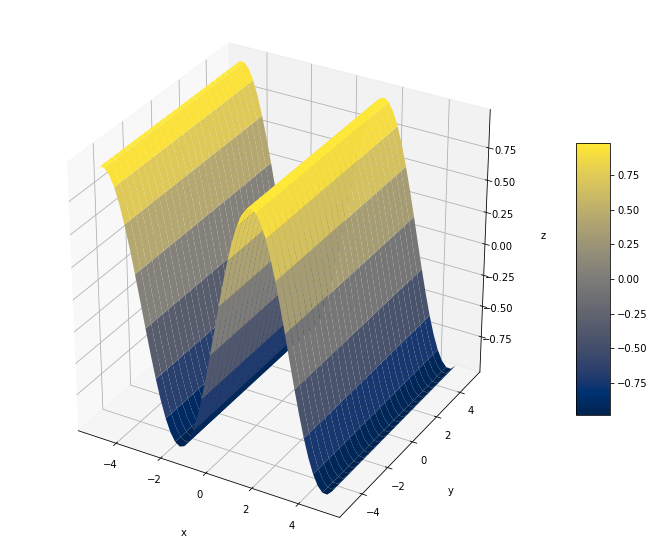

In [ ]:
# plot ribbon

plot_ribbon()

In [ ]:
def sample_ribbon(start=-5, end=5.1, increment=0.2, num_points=1000, dim=3):
    '''
    sample points uniformly from ribbon
    Inputs
    - start: starting point of sinusoidal function
    - end: ending point of sinusoidal function
    - increment: segment size between start and ed
    - num_points: number of points sampled from the sinusoidal manifold
    Outputs
    - points_mat:
    - flow_mat:
    Examples
    X = sample_ribbon()[0] # points
    X_ = sample_ribbon()[1] # flows
    '''
    # sample points
    sample_x = np.random.uniform(low=start, high=end, size = num_points)
    sample_y = np.random.uniform(low=start, high=end, size = num_points)

    points_mat = np.ndarray(shape=(num_points, dim))
    points_mat[:, 0] = sample_x
    points_mat[:, 1] = sample_y
    points_mat[:, 2] = np.sin(sample_x)

    # calculate flow: unit tangent line at each sampled point
    flow_mat = np.ndarray(shape = (num_points, dim))
    flow_mat[:, 0] = [1] * num_points
    flow_mat[:, 1] = [1] * num_points
    flow_mat[:, 2] = np.cos(sample_x)
    # row normalize
    row_sums = flow_mat.sum(axis=1)
    flow_mat = flow_mat / row_sums[:, np.newaxis]

    return points_mat, flow_mat


In [ ]:
X, X_ = sample_ribbon()

In [ ]:
def plot_ribbon_samples(points_mat, flow_mat):
    '''
    plot points sampled from the manifold with flow at each point, 
    where flow is defined as the unit tangent vector at each point
    Inputs
    - points_mat: matrix where each row is a point
    - flow_mat: matrix where each row is a derivative of each corresponding point in points_mat
    '''
    num_points, d = points_mat.shape
    fig = plt.figure(figsize = (12,10))
    ax = fig.add_subplot(projection='3d')

    # plot points
    ax.scatter(points_mat[:, 0], points_mat[:, 1], points_mat[:, 2], c=points_mat[:, 0])

    # plot flow
    mask_prob = 0 # percentage not plotted
    mask = np.random.rand(num_points) > mask_prob
    ax.quiver(points_mat[mask, 0], points_mat[mask, 1], points_mat[mask, 2], flow_mat[mask, 0], flow_mat[mask, 1], flow_mat[mask, 2], alpha=0.8, length=0.5)

    # label axis
    ax.set_xlabel('x', labelpad=20)
    ax.set_ylabel('y', labelpad=20)
    ax.set_zlabel('z', labelpad=20)

    plt.show()



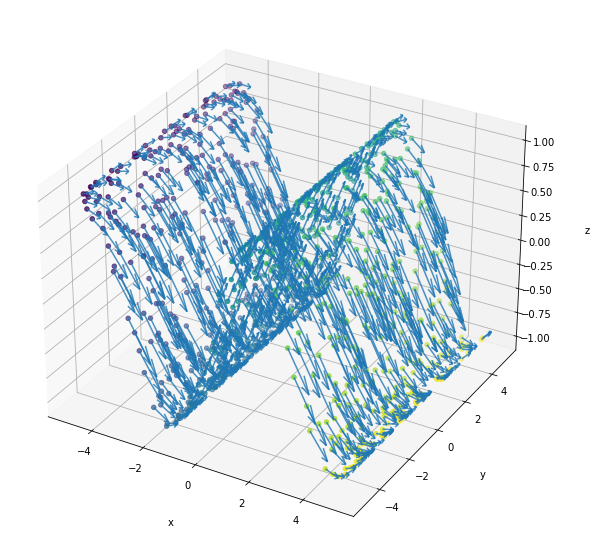

In [ ]:
plot_ribbon_samples(X, X_)

In [ ]:
def FlowArtist(FA_type, device,dim = 2, num_gauss = 0, shape = [2,4,8,4,2]):
    # Function to create tailored flow artist
    
    FA = nn.Sequential()
    
    if FA_type == "gaussian": # default = Gaussian model
        device = device
        FA = GaussianVectorField(dim,num_gauss, device=device).to(device)
    elif FA_type == "ReLU": # ReLu
        
        d_len = len(shape)*2
        d = OrderedDict()
        d[str(0)] = nn.Linear(2, shape[0])
        for i in range(1,d_len):
            if i%2 == 1:
                d[str(i)] = nn.LeakyReLU()
            else:
                d[str(i)] = nn.Linear(shape[int(i/2)-1], shape[int(i/2)])
        d[str(i)] = nn.Linear(shape[len(shape)-1], 2)
        
        # create MLP
        FA = nn.Sequential(d)
        
    elif FA_type == "tanh": # ReLu dim,2,4,8,4,2,dim
        shape = [2,4,8,4,2]
        FA = nn.Sequential(nn.Linear(dim, shape[0]),
                           nn.tanh(),
                           nn.Linear(shape[0], shape[1]),
                           nn.tanh(),
                           nn.Linear(shape[1], shape[2]),
                           nn.tanh(),
                           nn.Linear(shape[2], shape[3]),
                           nn.tanh(),
                           nn.Linear(shape[3], shape[4]),
                           nn.tanh(),
                           nn.Linear(shape[4], dim))
        
    return FA

In [ ]:
def smoothness_of_vector_field(embedded_points, vector_field_function, device, grid_width = 20):
  # find support of points
  minx = (min(embedded_points[:,0])-1).detach()
  maxx = (max(embedded_points[:,0])+1).detach()
  miny = (min(embedded_points[:,1])-1).detach()
  maxy = (max(embedded_points[:,1])+1).detach()
  # form grid around points
  x, y = torch.meshgrid(torch.linspace(minx,maxx,steps=grid_width),torch.linspace(miny,maxy,steps=grid_width))
  xy_t = torch.concat([x[:,:,None],y[:,:,None]],dim=2).float()
  xy_t = xy_t.reshape(grid_width**2,2).to(device)
  # Compute distances between points
  # TODO: Can compute A analytically for grid graph, don't need to run kernel
  Dists = torch.cdist(xy_t,xy_t)
  A = anisotropic_kernel(Dists)
  # comment this out in production
  # plt.imshow(A)
  # Get degree matrix and build graph laplacian
  D = A.sum(axis=1)
  L = D - A
  # compute vector field at each grid point
  vecs = vector_field_function(xy_t)
  x_vecs = vecs[:,0]
  y_vecs = vecs[:,1]
  # compute smoothness of each x and y and add them # TODO: There are other ways this could be done
  x_smoothness = (x_vecs.T @ L @ x_vecs) #/ torch.linalg.norm(x_vecs)**2
  y_smoothness = (y_vecs.T @ L @ y_vecs) #/ torch.linalg.norm(y_vecs)**2
  total_smoothness = x_smoothness + y_smoothness
  return total_smoothness

In [ ]:
def anisotropic_kernel(D, sigma=0.7, alpha = 1):
  """Computes anisotropic kernel of given distances matrix.

  Parameters
  ----------
  D : ndarray or sparse
  sigma : float, optional
      Kernel bandwidth, by default 0.7
  alpha : int, optional
      Degree of density normalization, from 0 to 1; by default 1
  This is a good function.
  """
  W = torch.exp(-D**2/(2*sigma**2))
  # Additional normalization step for density
  D = torch.diag(1/(torch.sum(W,axis=1)**alpha)) 
  W = D @ W @ D
  return W

In [ ]:
X = torch.tensor(X)
X_ = torch.tensor(X_)
X = X.float().to(device)
X_ = X_.float().to(device)

  0%|          | 0/2000 [00:00<?, ?it/s]

EPOCH 0. Loss 2.8426811695098877. Flow strength 4.999000072479248. Weight of flow 0.5 Heatmap of P embedding is 


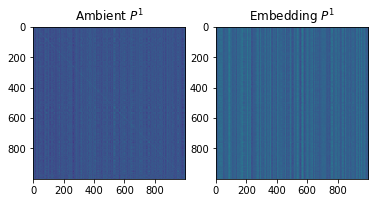

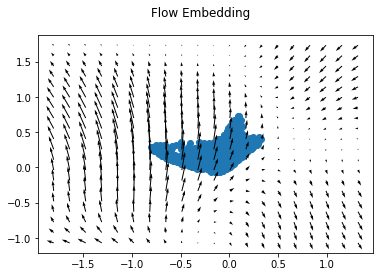

  5%|▌         | 100/2000 [00:09<02:56, 10.79it/s]

EPOCH 100. Loss 1.4078634977340698. Flow strength 4.945915222167969. Weight of flow 0.5 Heatmap of P embedding is 


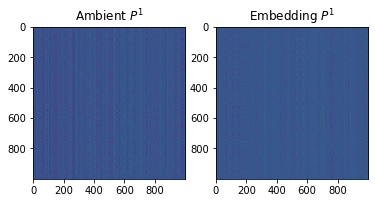

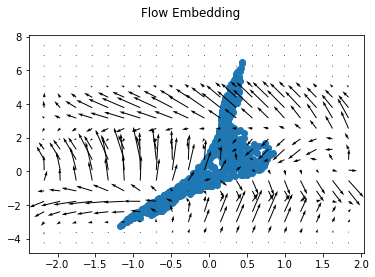

 10%|▉         | 199/2000 [00:19<02:49, 10.66it/s]

EPOCH 200. Loss 0.8079120516777039. Flow strength 4.885854721069336. Weight of flow 0.5 Heatmap of P embedding is 


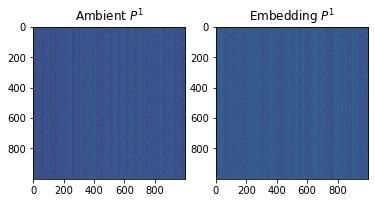

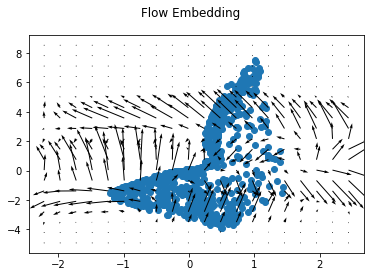

 15%|█▌        | 300/2000 [00:30<02:39, 10.66it/s]

EPOCH 300. Loss 0.04275408014655113. Flow strength 4.749297142028809. Weight of flow 0.5 Heatmap of P embedding is 


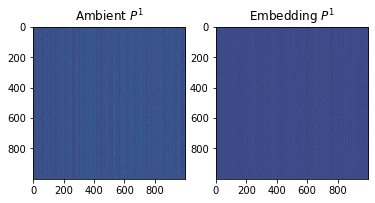

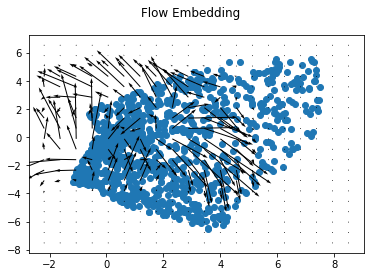

 20%|██        | 400/2000 [00:40<02:29, 10.67it/s]

EPOCH 400. Loss 0.014572490938007832. Flow strength 4.635200500488281. Weight of flow 0.5 Heatmap of P embedding is 


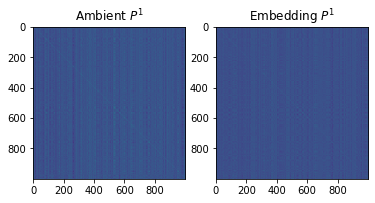

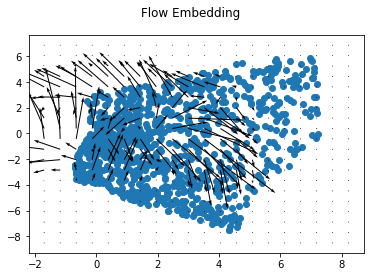

 25%|██▍       | 499/2000 [00:50<02:20, 10.68it/s]

EPOCH 500. Loss 0.010694964788854122. Flow strength 4.521869659423828. Weight of flow 0.5 Heatmap of P embedding is 


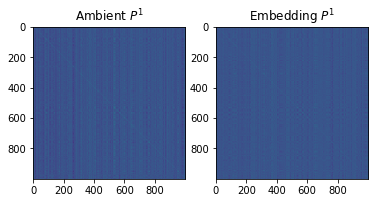

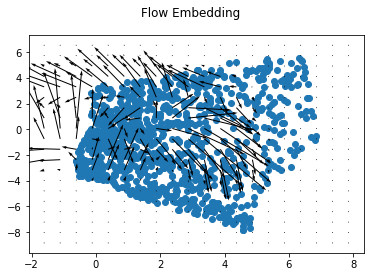

 30%|███       | 600/2000 [01:00<02:11, 10.69it/s]

EPOCH 600. Loss 0.009899936616420746. Flow strength 4.410501003265381. Weight of flow 0.5 Heatmap of P embedding is 


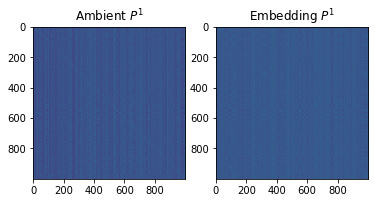

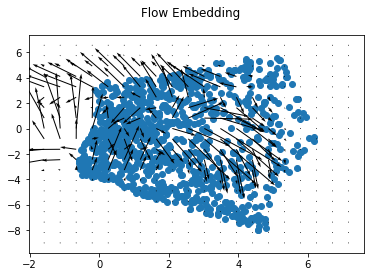

 35%|███▌      | 700/2000 [01:10<02:01, 10.69it/s]

EPOCH 700. Loss 0.008892836049199104. Flow strength 4.301568984985352. Weight of flow 0.5 Heatmap of P embedding is 


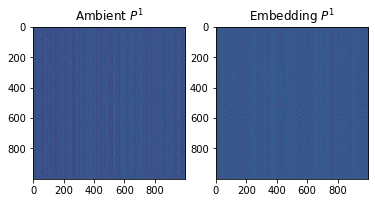

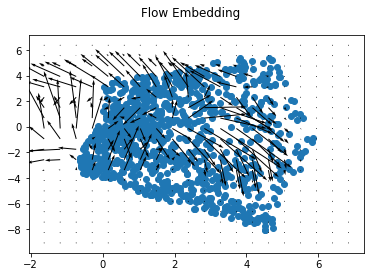

 40%|███▉      | 799/2000 [01:20<01:54, 10.47it/s]

EPOCH 800. Loss 0.008051332086324692. Flow strength 4.1944684982299805. Weight of flow 0.5 Heatmap of P embedding is 


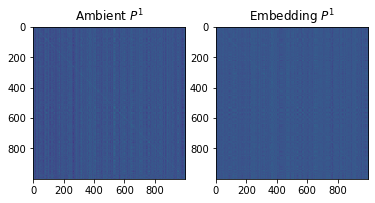

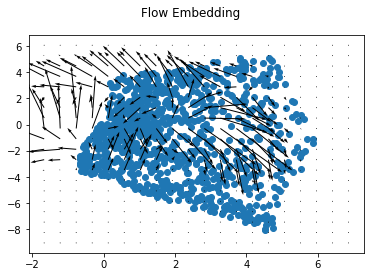

 45%|████▍     | 899/2000 [01:30<01:43, 10.69it/s]

EPOCH 900. Loss 0.007378447335213423. Flow strength 4.089964389801025. Weight of flow 0.5 Heatmap of P embedding is 


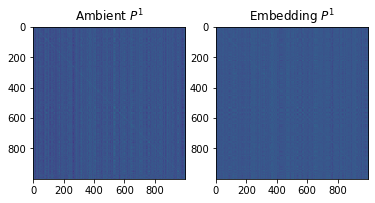

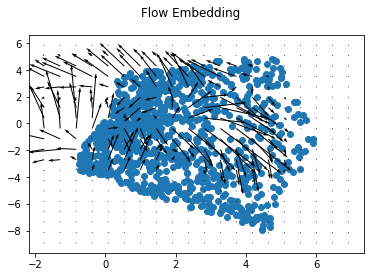

 50%|█████     | 1000/2000 [01:40<01:36, 10.36it/s]

EPOCH 1000. Loss 0.006965006701648235. Flow strength 3.9876904487609863. Weight of flow 0.5 Heatmap of P embedding is 


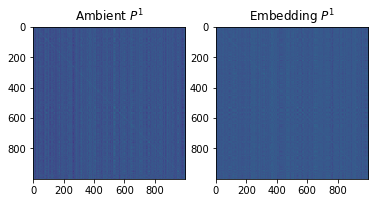

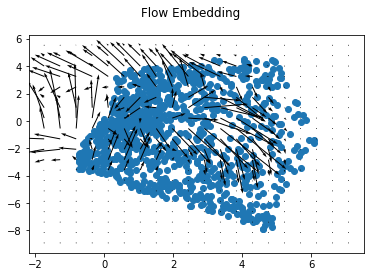

 55%|█████▍    | 1099/2000 [01:51<01:25, 10.54it/s]

EPOCH 1100. Loss 0.006719134282320738. Flow strength 3.887698173522949. Weight of flow 0.5 Heatmap of P embedding is 


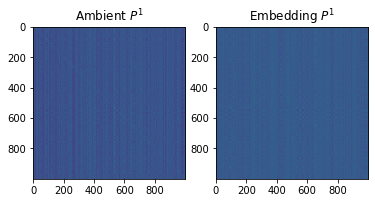

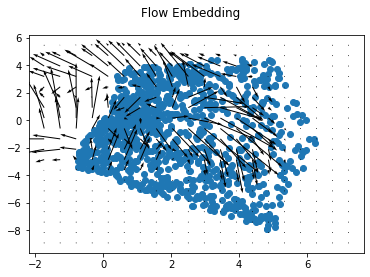

 60%|█████▉    | 1199/2000 [02:01<01:15, 10.62it/s]

EPOCH 1200. Loss 0.006414760835468769. Flow strength 3.790224313735962. Weight of flow 0.5 Heatmap of P embedding is 


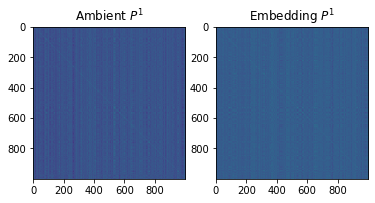

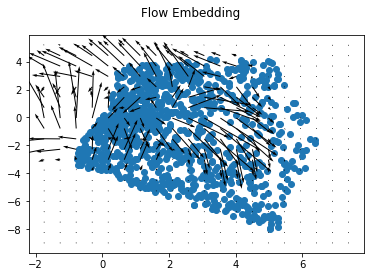

 65%|██████▍   | 1299/2000 [02:11<01:06, 10.49it/s]

EPOCH 1300. Loss 0.005838961340487003. Flow strength 3.7013463973999023. Weight of flow 0.5 Heatmap of P embedding is 


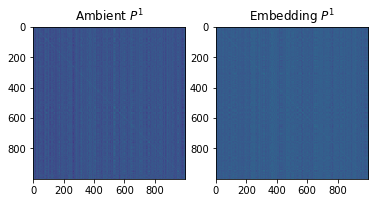

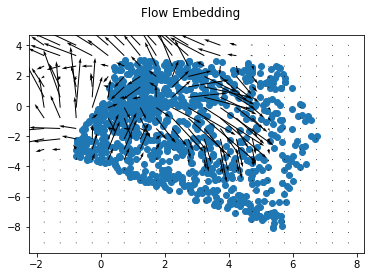

 70%|██████▉   | 1399/2000 [02:22<00:57, 10.54it/s]

EPOCH 1400. Loss 0.005752899684011936. Flow strength 3.6184334754943848. Weight of flow 0.5 Heatmap of P embedding is 


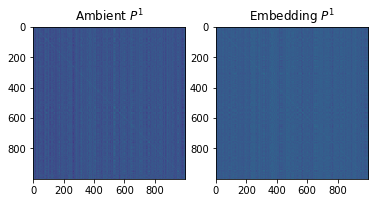

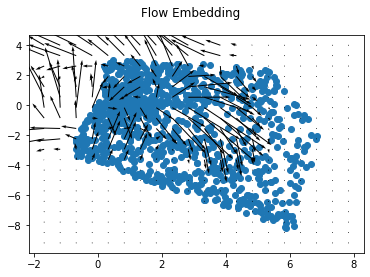

 75%|███████▌  | 1500/2000 [02:32<00:47, 10.46it/s]

EPOCH 1500. Loss 0.005611590575426817. Flow strength 3.5350189208984375. Weight of flow 0.5 Heatmap of P embedding is 


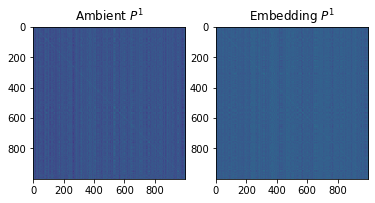

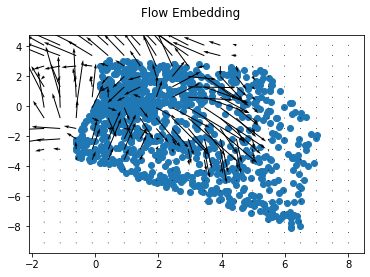

 80%|███████▉  | 1599/2000 [02:42<00:38, 10.45it/s]

EPOCH 1600. Loss 0.00565157737582922. Flow strength 3.450735569000244. Weight of flow 0.5 Heatmap of P embedding is 


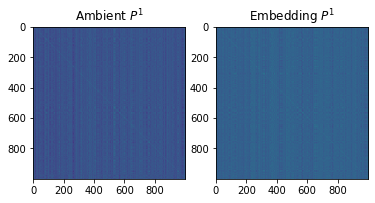

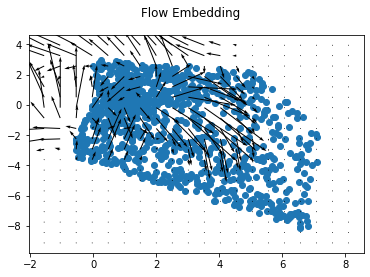

 85%|████████▌ | 1700/2000 [02:53<00:28, 10.36it/s]

EPOCH 1700. Loss 0.005395710468292236. Flow strength 3.3663368225097656. Weight of flow 0.5 Heatmap of P embedding is 


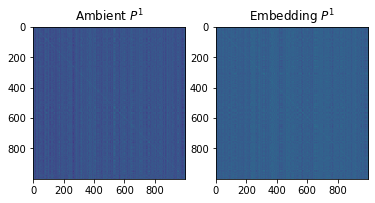

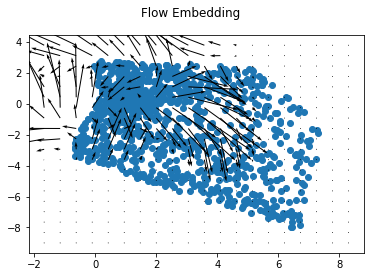

 90%|█████████ | 1800/2000 [03:03<00:19, 10.39it/s]

EPOCH 1800. Loss 0.005253476090729237. Flow strength 3.2841622829437256. Weight of flow 0.5 Heatmap of P embedding is 


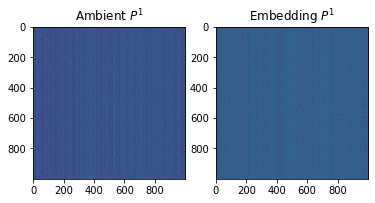

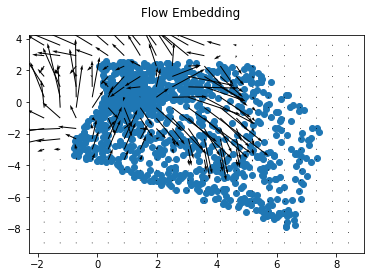

 95%|█████████▍| 1899/2000 [03:13<00:09, 10.31it/s]

EPOCH 1900. Loss 0.005219319835305214. Flow strength 3.201883316040039. Weight of flow 0.5 Heatmap of P embedding is 


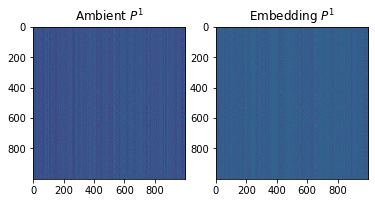

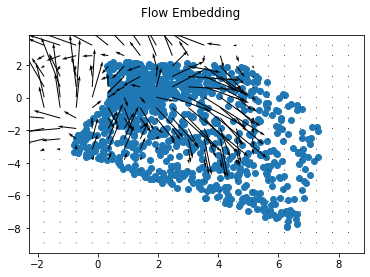

100%|██████████| 2000/2000 [03:24<00:00,  9.79it/s]


Exiting training with loss  tensor(0.0051, device='cuda:0', grad_fn=<AddBackward0>)


In [ ]:
dfe = DiffusionFlowEmbedder(X,
X_,
t=1,
sigma_graph=15,
sigma_embedding=15,
device=device, 
autoencoder_shape = [50,10],
flow_artist_shape=[30,20,10],
flow_strength_graph=2, 
flow_strength_embedding=5, 
learnable_flow_strength=True,
weight_of_flow = 0.5,
learning_rate=0.001
)
dfe = dfe.to(device)
embeddings = dfe.fit(n_steps=2000)

# Test Example 2: 2D Ribbon

In [ ]:
def sample_ribbon_2D(start=-5, end=5.1, increment=0.2, num_points=1000, dim=2):
    '''
    sample points uniformly from ribbon
    Inputs
    - start: starting point of sinusoidal function
    - end: ending point of sinusoidal function
    - increment: segment size between start and ed
    - num_points: number of points sampled from the sinusoidal manifold
    Outputs
    - points_mat:
    - flow_mat:
    Examples
    X = sample_ribbon()[0] # points
    X_ = sample_ribbon()[1] # flows
    '''
    # sample points
    sample_x = np.random.uniform(low=start, high=end, size = num_points)

    points_mat = np.ndarray(shape=(num_points, dim))
    points_mat[:, 0] = sample_x
    points_mat[:, 1] = np.sin(sample_x)

    # calculate flow: unit tangent line at each sampled point
    flow_mat = np.ndarray(shape = (num_points, dim))
    flow_mat[:, 0] = [1] * num_points
    flow_mat[:, 1] = np.cos(sample_x)
    # row normalize
    # row_sums = flow_mat.sum(axis=1)
    # flow_mat = flow_mat / row_sums[:, np.newaxis]

    return points_mat, flow_mat


In [ ]:
X = sample_ribbon_2D()[0] # points
X_ = sample_ribbon_2D()[1] # flows

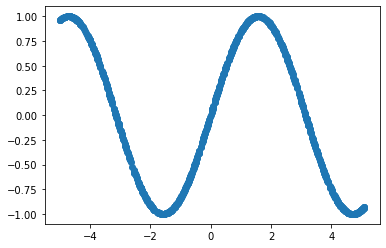

In [ ]:
plt.scatter(X[:, 0], X[:, 1])

plt.show()

In [ ]:
def plot_ribbon_samples_2D(points_mat, flow_mat):
    '''
    plot points sampled from the manifold with flow at each point, 
    where flow is defined as the unit tangent vector at each point
    Inputs
    - points_mat: matrix where each row is a point
    - flow_mat: matrix where each row is a derivative of each corresponding point in points_mat
    '''
    num_points, d = points_mat.shape
    fig = plt.figure(figsize = (12,10))
    ax = fig.add_subplot()

    # plot points
    plt.scatter(points_mat[:, 0], points_mat[:, 1])

    # plot flow
    mask_prob = 0 # percentage not plotted
    mask = np.random.rand(num_points) > mask_prob
    ax.quiver(points_mat[mask, 0], points_mat[mask, 1], flow_mat[mask, 0], flow_mat[mask, 1], alpha=0.8)

    # label axis
    ax.set_xlabel('x', labelpad=20)
    ax.set_ylabel('y', labelpad=20)

    plt.show()



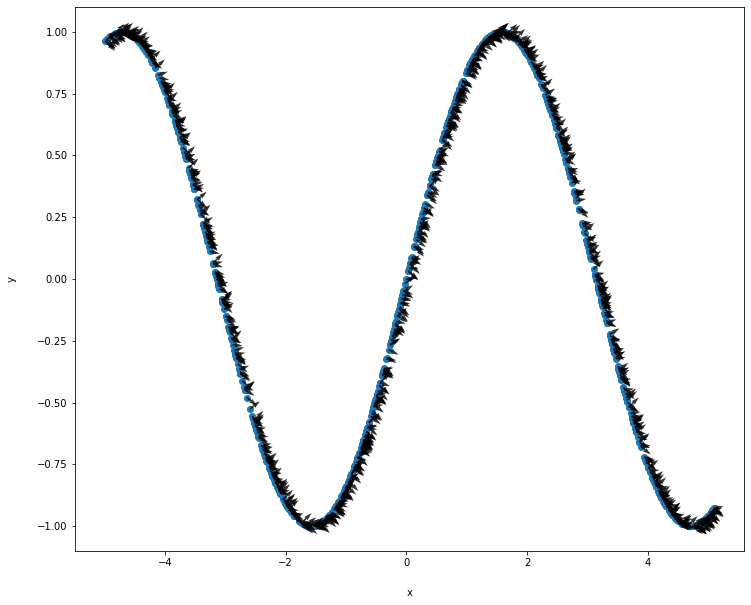

In [ ]:
plot_ribbon_samples_2D(X, X_)

In [ ]:
X = torch.tensor(X)
X_ = torch.tensor(X_)
X = X.float().to(device)
X_ = X_.float().to(device)

  0%|          | 0/2000 [00:00<?, ?it/s]

EPOCH 0. Loss 2.267374038696289. Flow strength 4.999000072479248. Weight of flow 0.5 Heatmap of P embedding is 


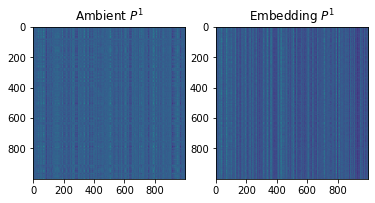

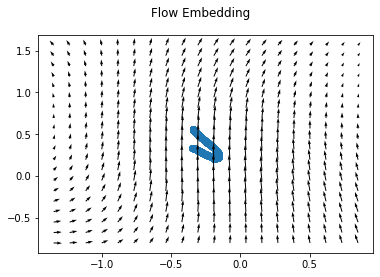

  5%|▍         | 99/2000 [00:10<03:02, 10.42it/s]

EPOCH 100. Loss 0.8030524253845215. Flow strength 4.930872917175293. Weight of flow 0.5 Heatmap of P embedding is 


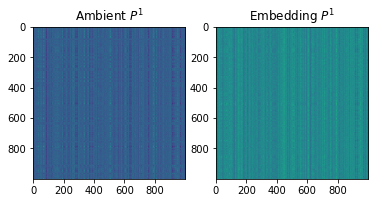

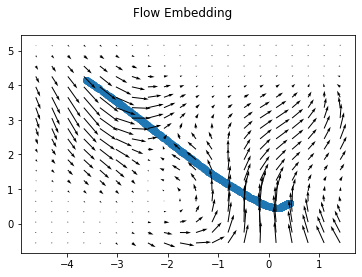

 10%|█         | 200/2000 [00:22<02:56, 10.19it/s]

EPOCH 200. Loss 0.03492240980267525. Flow strength 4.90925931930542. Weight of flow 0.5 Heatmap of P embedding is 


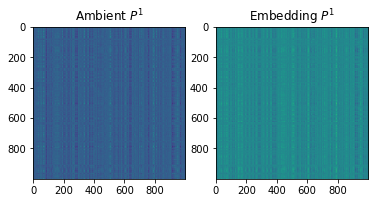

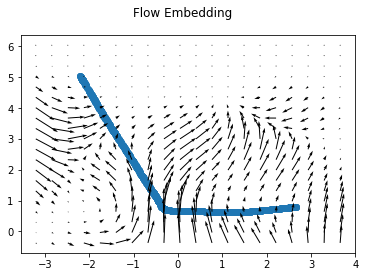

 15%|█▌        | 300/2000 [00:33<02:46, 10.20it/s]

EPOCH 300. Loss 0.00773196155205369. Flow strength 4.893085956573486. Weight of flow 0.5 Heatmap of P embedding is 


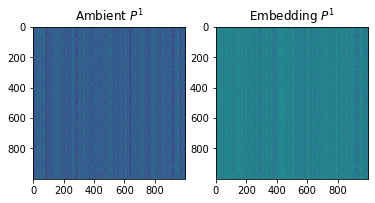

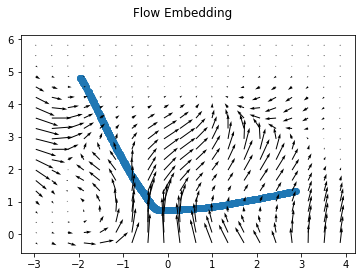

 20%|██        | 400/2000 [00:43<02:37, 10.16it/s]

EPOCH 400. Loss 0.007493352517485619. Flow strength 4.870534896850586. Weight of flow 0.5 Heatmap of P embedding is 


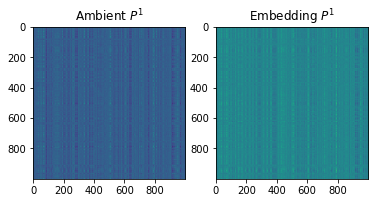

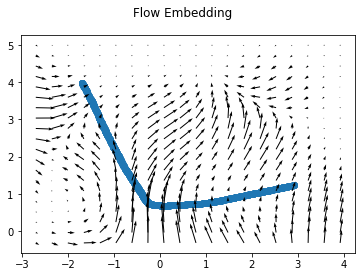

 25%|██▌       | 500/2000 [00:53<02:25, 10.34it/s]

EPOCH 500. Loss 0.007291833404451609. Flow strength 4.844733715057373. Weight of flow 0.5 Heatmap of P embedding is 


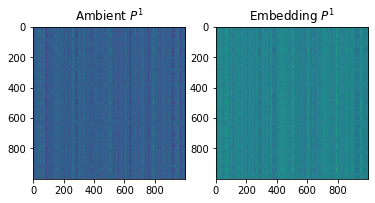

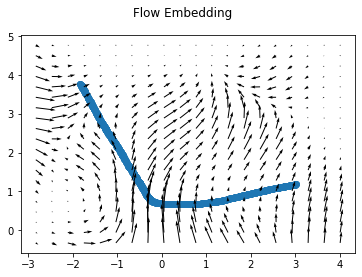

 30%|███       | 600/2000 [01:04<02:16, 10.28it/s]

EPOCH 600. Loss 0.00758948503062129. Flow strength 4.816965103149414. Weight of flow 0.5 Heatmap of P embedding is 


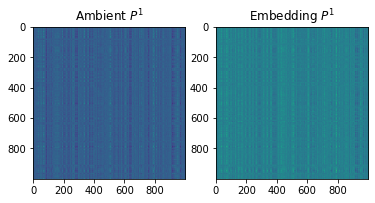

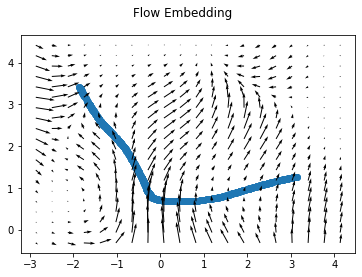

 35%|███▍      | 699/2000 [01:14<02:07, 10.18it/s]

EPOCH 700. Loss 0.006294858176261187. Flow strength 4.7881669998168945. Weight of flow 0.5 Heatmap of P embedding is 


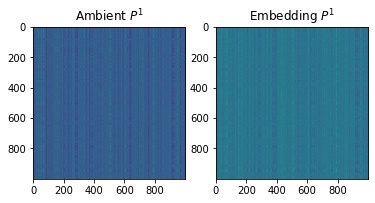

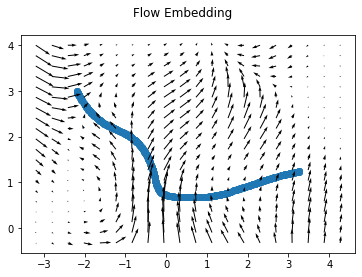

 40%|████      | 800/2000 [01:25<02:04,  9.62it/s]

EPOCH 800. Loss 0.005905507132411003. Flow strength 4.758481979370117. Weight of flow 0.5 Heatmap of P embedding is 


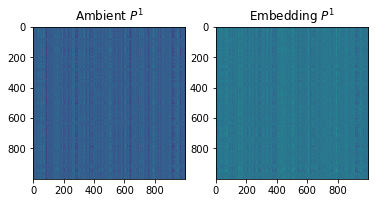

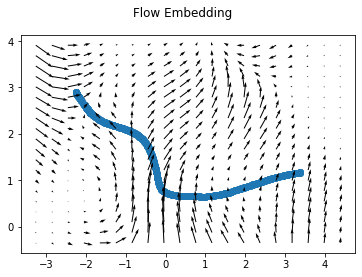

 45%|████▌     | 900/2000 [01:36<01:48, 10.15it/s]

EPOCH 900. Loss 0.005423759575933218. Flow strength 4.72703218460083. Weight of flow 0.5 Heatmap of P embedding is 


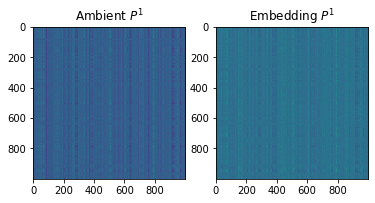

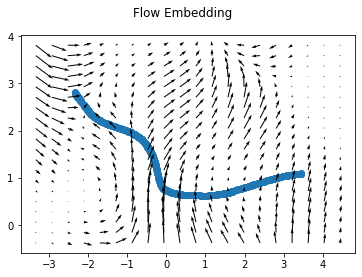

 50%|█████     | 1000/2000 [01:47<01:41,  9.82it/s]

EPOCH 1000. Loss 0.006107199005782604. Flow strength 4.693055629730225. Weight of flow 0.5 Heatmap of P embedding is 


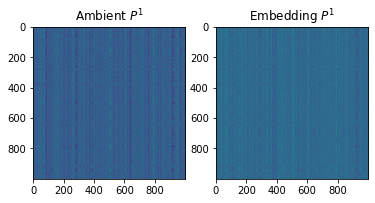

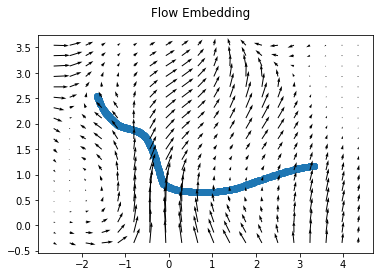

 55%|█████▌    | 1100/2000 [01:58<01:33,  9.58it/s]

EPOCH 1100. Loss 0.005767404567450285. Flow strength 4.657916069030762. Weight of flow 0.5 Heatmap of P embedding is 


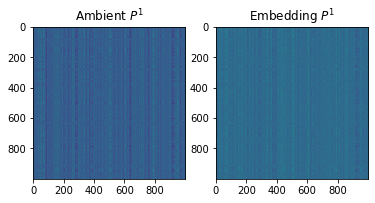

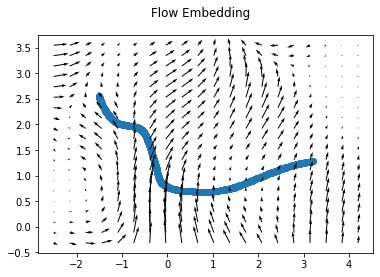

 60%|█████▉    | 1199/2000 [02:10<01:22,  9.71it/s]

EPOCH 1200. Loss 0.005000043194741011. Flow strength 4.623798370361328. Weight of flow 0.5 Heatmap of P embedding is 


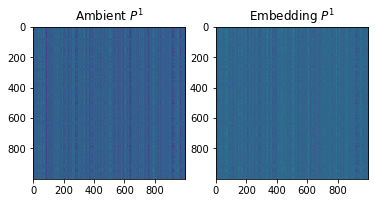

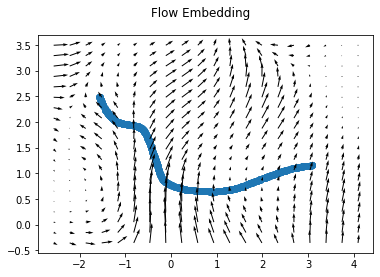

 65%|██████▌   | 1300/2000 [02:21<01:12,  9.68it/s]

EPOCH 1300. Loss 0.005074911750853062. Flow strength 4.591616630554199. Weight of flow 0.5 Heatmap of P embedding is 


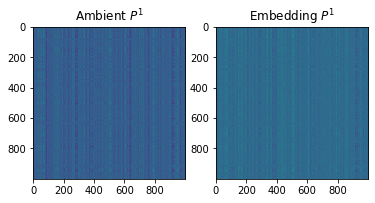

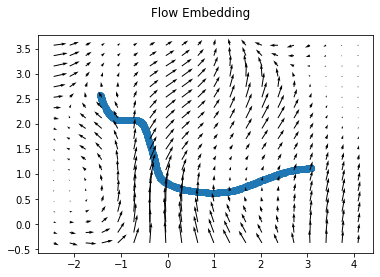

 70%|███████   | 1400/2000 [02:32<01:02,  9.56it/s]

EPOCH 1400. Loss 0.00516520906239748. Flow strength 4.560543537139893. Weight of flow 0.5 Heatmap of P embedding is 


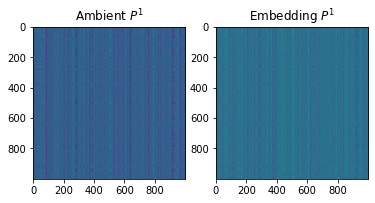

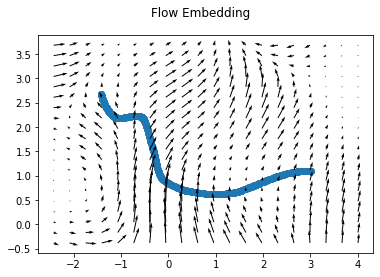

 75%|███████▌  | 1500/2000 [02:44<01:36,  5.19it/s]

EPOCH 1500. Loss 0.0050337910652160645. Flow strength 4.527136325836182. Weight of flow 0.5 Heatmap of P embedding is 


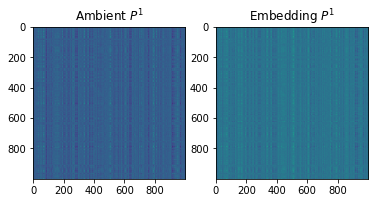

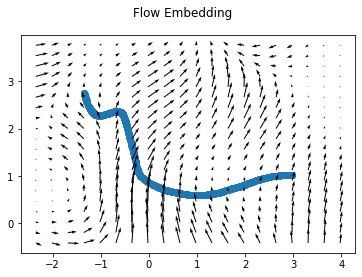

 80%|████████  | 1600/2000 [02:55<00:42,  9.48it/s]

EPOCH 1600. Loss 0.004285886418074369. Flow strength 4.495411396026611. Weight of flow 0.5 Heatmap of P embedding is 


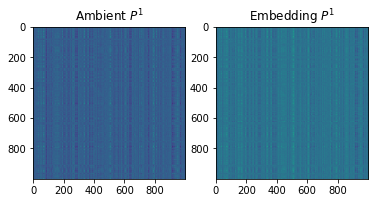

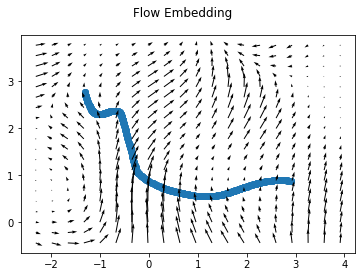

 85%|████████▌ | 1700/2000 [03:06<00:31,  9.47it/s]

EPOCH 1700. Loss 0.004242015536874533. Flow strength 4.464109897613525. Weight of flow 0.5 Heatmap of P embedding is 


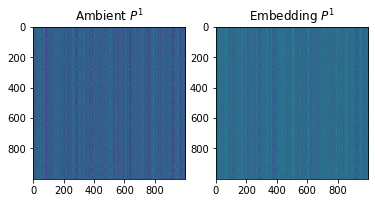

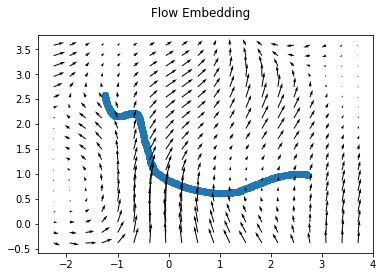

 90%|█████████ | 1800/2000 [03:17<00:21,  9.37it/s]

EPOCH 1800. Loss 0.003766811452805996. Flow strength 4.436857223510742. Weight of flow 0.5 Heatmap of P embedding is 


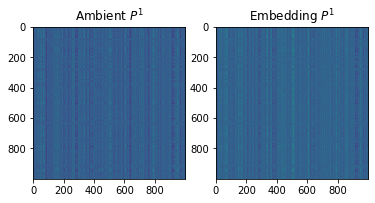

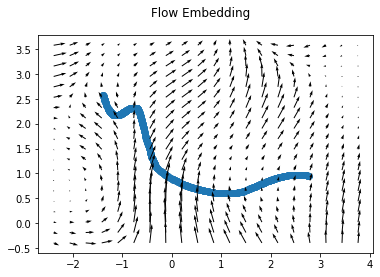

 95%|█████████▌| 1900/2000 [03:29<00:11,  9.07it/s]

EPOCH 1900. Loss 0.0036300173960626125. Flow strength 4.4139885902404785. Weight of flow 0.5 Heatmap of P embedding is 


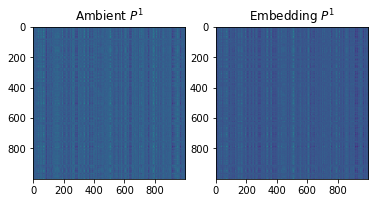

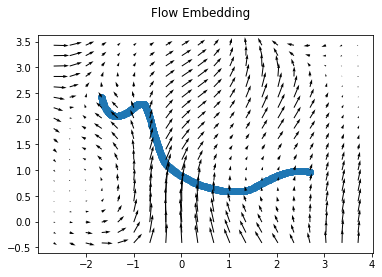

100%|██████████| 2000/2000 [03:40<00:00,  9.06it/s]

Exiting training with loss  tensor(0.0035, device='cuda:0', grad_fn=<AddBackward0>)


In [ ]:
dfe = DiffusionFlowEmbedder(X,
X_,
t=1,
sigma_graph=15,
sigma_embedding=15,
device=device, 
autoencoder_shape = [50,10],
flow_artist_shape=[30,20,10],
flow_strength_graph=2, 
flow_strength_embedding=5, 
learnable_flow_strength=True,
weight_of_flow = 0.5,
learning_rate=0.001
)
dfe = dfe.to(device)
embeddings = dfe.fit(n_steps=2000)

# Test Example 3: 2D Moon

Using sklearn without flow

In [ ]:
from sklearn.datasets import make_moons

In [ ]:
def create_moons(num_points=100, dim=2):
  data = make_moons(n_samples=num_points, shuffle=True, noise=None, random_state=None)
  points_mat = data[0]
  sample_x = points_mat[:, 0]

  flow_mat = np.ndarray(shape = (num_points, dim))
  flow_mat[:, 0] = [1] * num_points
  flow_mat[:, 1] = np.cos(sample_x)
  return points_mat, flow_mat

In [ ]:
def plot_moons(points_mat, flow_mat):
  num_points, d = points_mat.shape
  fig = plt.figure(figsize = (12,10))
  ax = fig.add_subplot()

  # plot points
  plt.scatter(points_mat[:, 0], points_mat[:, 1])

  # plot flow
  mask_prob = 0 # percentage not plotted
  mask = np.random.rand(num_points) > mask_prob
  ax.quiver(points_mat[mask, 0], points_mat[mask, 1], flow_mat[mask, 0], flow_mat[mask, 1], alpha=0.8)

  # label axis
  ax.set_xlabel('x', labelpad=20)
  ax.set_ylabel('y', labelpad=20)

  plt.show()

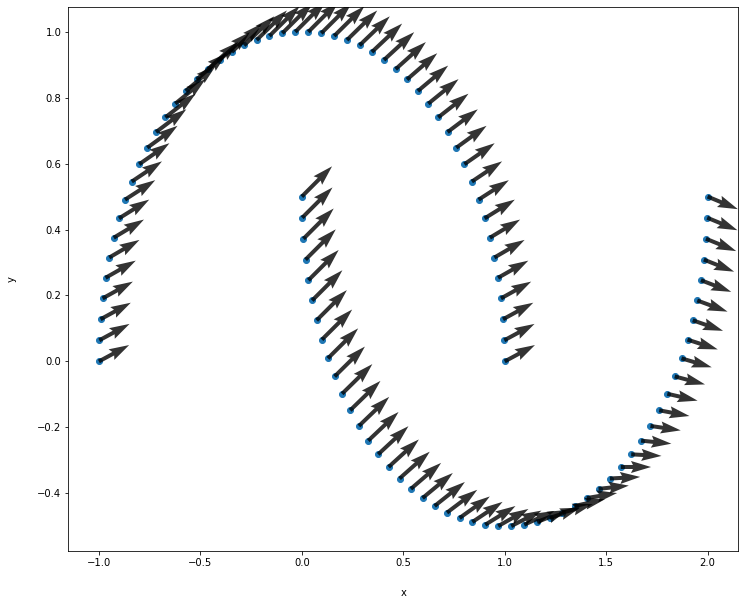

In [ ]:
X, X_ = create_moons()
plot_moons(X, X_)

In [ ]:
X = torch.tensor(X)
X_ = torch.tensor(X_)
X = X.float().to(device)
X_ = X_.float().to(device)

  0%|          | 0/2000 [00:00<?, ?it/s]

EPOCH 0. Loss 0.3775668740272522. Flow strength 4.999000072479248. Weight of flow 0.5 Heatmap of P embedding is 


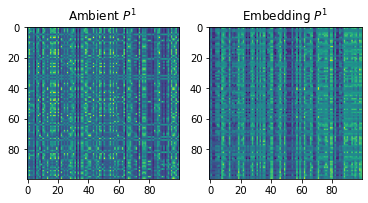

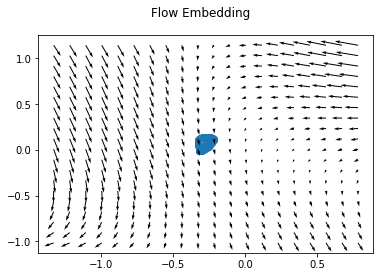

  5%|▍         | 95/2000 [00:02<00:31, 60.35it/s]

EPOCH 100. Loss 0.12163625657558441. Flow strength 4.975743770599365. Weight of flow 0.5 Heatmap of P embedding is 


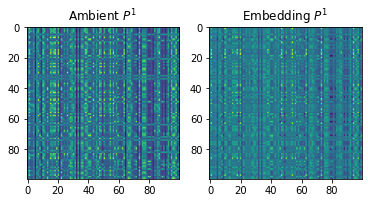

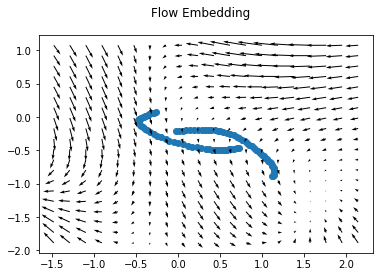

 10%|▉         | 198/2000 [00:04<00:29, 61.67it/s]

EPOCH 200. Loss 0.019410546869039536. Flow strength 4.924338340759277. Weight of flow 0.5 Heatmap of P embedding is 


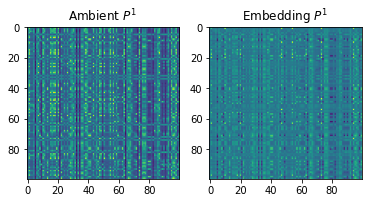

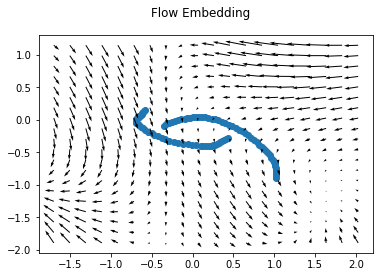

 15%|█▍        | 295/2000 [00:06<00:27, 61.77it/s]

EPOCH 300. Loss 0.004394510295242071. Flow strength 4.865950584411621. Weight of flow 0.5 Heatmap of P embedding is 


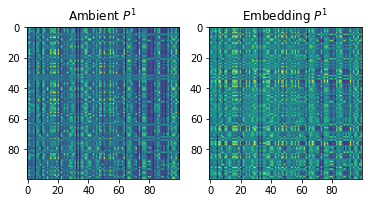

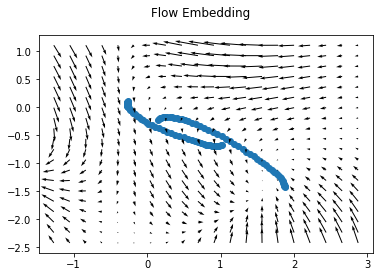

 20%|█▉        | 395/2000 [00:08<00:30, 52.26it/s]

EPOCH 400. Loss 0.0017541111446917057. Flow strength 4.90264368057251. Weight of flow 0.5 Heatmap of P embedding is 


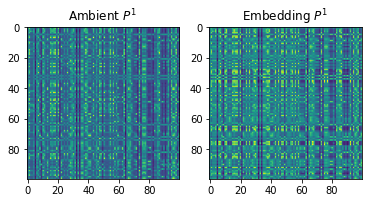

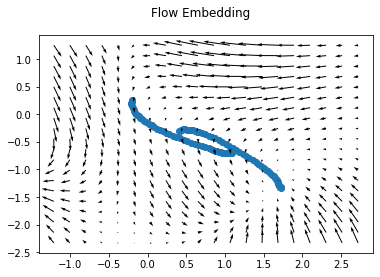

 25%|██▍       | 499/2000 [00:11<00:25, 59.46it/s]

EPOCH 500. Loss 0.0013351594097912312. Flow strength 4.950645923614502. Weight of flow 0.5 Heatmap of P embedding is 


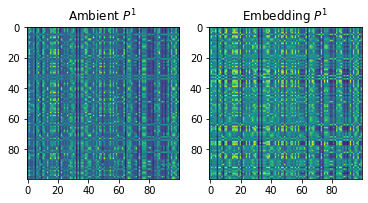

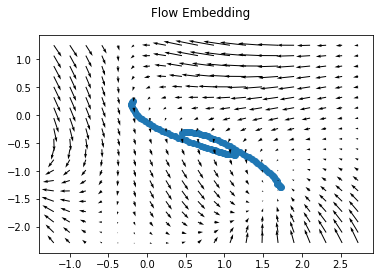

 30%|███       | 600/2000 [00:13<00:22, 61.00it/s]

EPOCH 600. Loss 0.002623326377943158. Flow strength 4.951179027557373. Weight of flow 0.5 Heatmap of P embedding is 


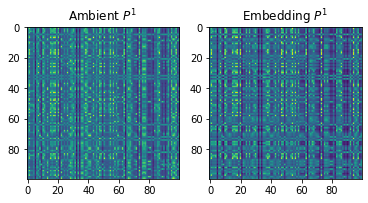

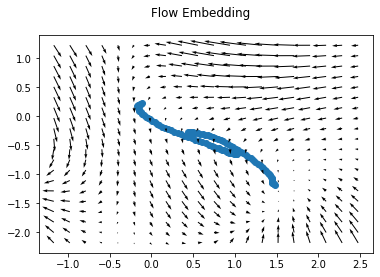

 35%|███▌      | 700/2000 [00:15<00:21, 60.59it/s]

EPOCH 700. Loss 0.0013636060757562518. Flow strength 4.993727207183838. Weight of flow 0.5 Heatmap of P embedding is 


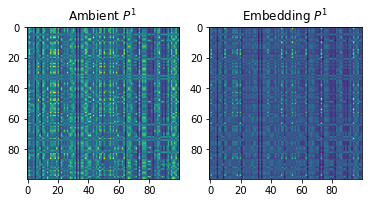

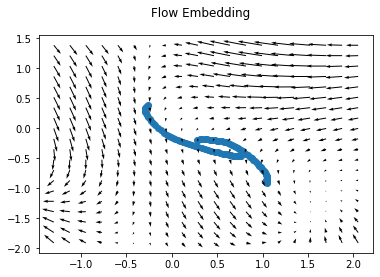

 40%|███▉      | 797/2000 [00:17<00:20, 59.30it/s]

EPOCH 800. Loss 0.0010572175960987806. Flow strength 5.0321221351623535. Weight of flow 0.5 Heatmap of P embedding is 


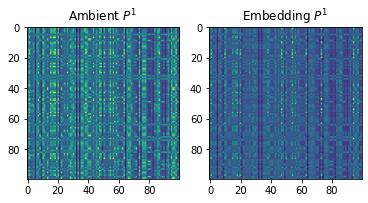

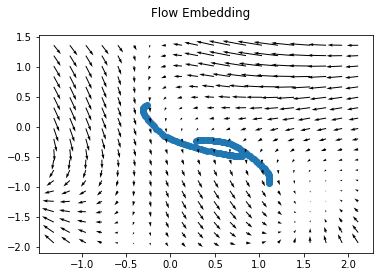

 45%|████▍     | 898/2000 [00:19<00:18, 60.92it/s]

EPOCH 900. Loss 0.0009728575823828578. Flow strength 5.0723042488098145. Weight of flow 0.5 Heatmap of P embedding is 


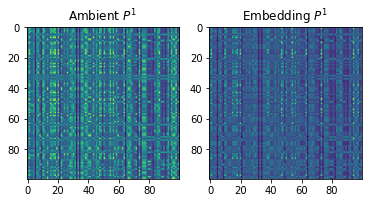

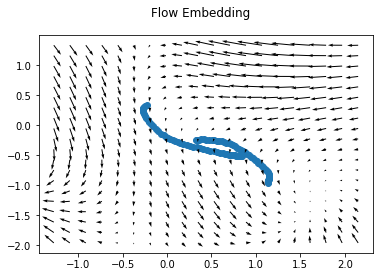

 50%|████▉     | 997/2000 [00:21<00:16, 61.24it/s]

EPOCH 1000. Loss 0.0009354885551147163. Flow strength 5.124723434448242. Weight of flow 0.5 Heatmap of P embedding is 


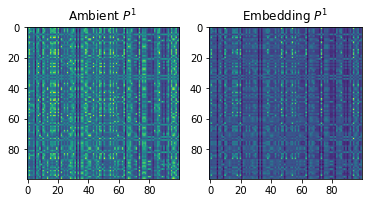

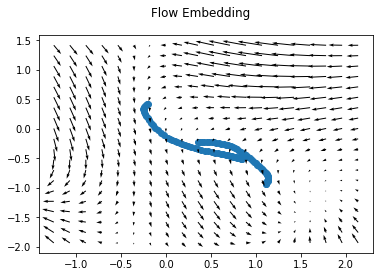

 55%|█████▌    | 1100/2000 [00:24<00:15, 59.24it/s]

EPOCH 1100. Loss 0.0009239176288247108. Flow strength 5.182295799255371. Weight of flow 0.5 Heatmap of P embedding is 


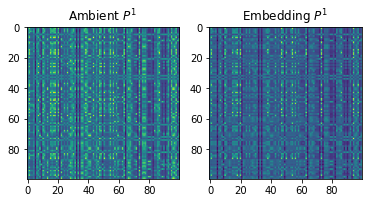

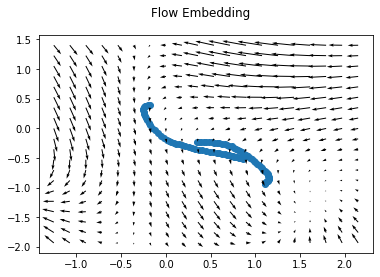

 60%|█████▉    | 1194/2000 [00:26<00:13, 58.06it/s]

EPOCH 1200. Loss 0.0008565710741095245. Flow strength 5.246302604675293. Weight of flow 0.5 Heatmap of P embedding is 


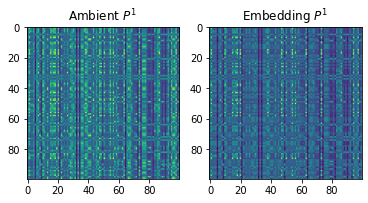

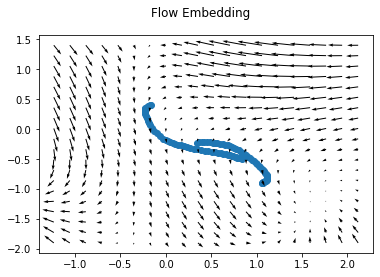

 65%|██████▌   | 1300/2000 [00:28<00:12, 57.29it/s]

EPOCH 1300. Loss 0.0007500083884224296. Flow strength 5.319715976715088. Weight of flow 0.5 Heatmap of P embedding is 


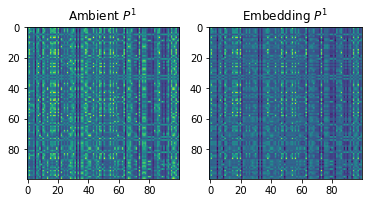

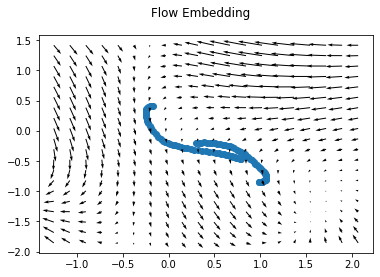

 70%|██████▉   | 1398/2000 [00:30<00:10, 57.47it/s]

EPOCH 1400. Loss 0.0007075403700582683. Flow strength 5.382748603820801. Weight of flow 0.5 Heatmap of P embedding is 


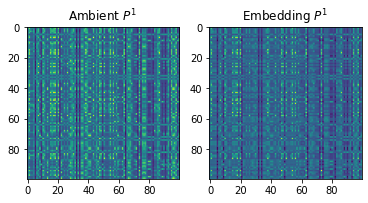

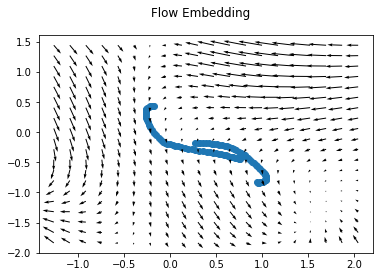

 75%|███████▌  | 1500/2000 [00:33<00:08, 56.75it/s]

EPOCH 1500. Loss 0.0008928114548325539. Flow strength 5.429436683654785. Weight of flow 0.5 Heatmap of P embedding is 


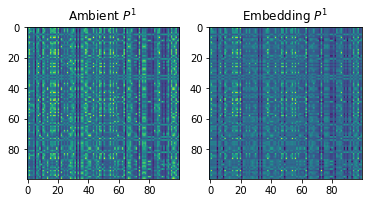

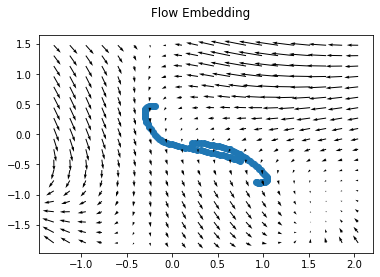

 80%|███████▉  | 1597/2000 [00:35<00:06, 57.95it/s]

EPOCH 1600. Loss 0.0012010990176349878. Flow strength 5.476613521575928. Weight of flow 0.5 Heatmap of P embedding is 


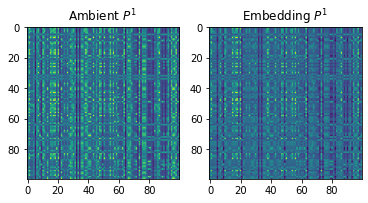

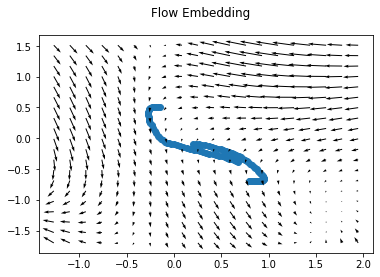

 85%|████████▌ | 1700/2000 [00:37<00:05, 56.98it/s]

EPOCH 1700. Loss 0.000853260513395071. Flow strength 5.536291599273682. Weight of flow 0.5 Heatmap of P embedding is 


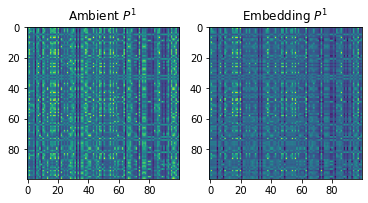

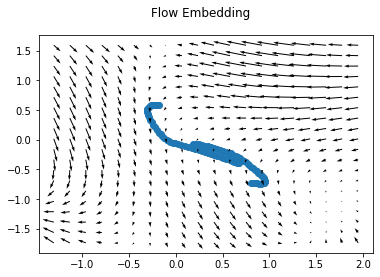

 90%|████████▉ | 1797/2000 [00:39<00:03, 55.87it/s]

EPOCH 1800. Loss 0.0022923736833035946. Flow strength 5.5919599533081055. Weight of flow 0.5 Heatmap of P embedding is 


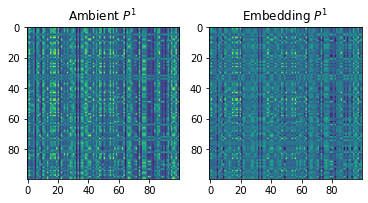

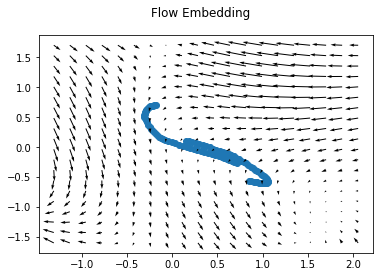

 95%|█████████▌| 1900/2000 [00:42<00:01, 58.30it/s]

EPOCH 1900. Loss 0.0022317038383334875. Flow strength 5.592588901519775. Weight of flow 0.5 Heatmap of P embedding is 


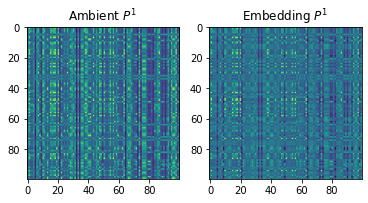

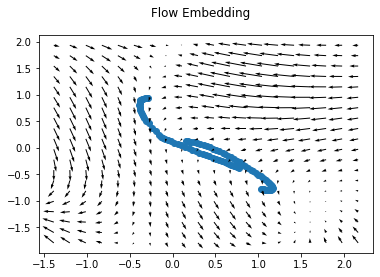

100%|██████████| 2000/2000 [00:44<00:00, 45.03it/s]

Exiting training with loss  tensor(0.0008, device='cuda:0', grad_fn=<AddBackward0>)


In [ ]:
dfe = DiffusionFlowEmbedder(X,
X_,
t=1,
sigma_graph=15,
sigma_embedding=15,
device=device, 
autoencoder_shape = [50,10],
flow_artist_shape=[30,20,10],
flow_strength_graph=2, 
flow_strength_embedding=5, 
learnable_flow_strength=True,
weight_of_flow = 0.5,
learning_rate=0.001
)
dfe = dfe.to(device)
embeddings = dfe.fit(n_steps=2000)

# Test example 4: 2 moons without library

In [ ]:
def create_moons(start=-6, end=6, dim=2, num_points=100):
    halfway = int(num_points/2)
    sample_x = np.zeros(num_points)
    sample_x[0:halfway] = np.random.uniform(low=start, high=int(end/2), size = int(num_points/2))
    sample_x[halfway:num_points] = np.random.uniform(low=int(end/2), high=end, size = int(num_points/2))
    sample_x = np.random.uniform(low=start, high=end, size = num_points)
    y_noise = np.random.uniform(low=-2, high=2, size = num_points)

    points_mat = np.ndarray(shape=(num_points, dim))
    points_mat[:, 0] = sample_x
    points_mat[0:halfway, 1] = (sample_x[0:halfway]-2)**2 + y_noise[0:halfway]
    points_mat[halfway:num_points, 1] = -((sample_x[halfway:num_points])**2)+8 + y_noise[halfway:num_points]

    # calculate flow: unit tangent line at each sampled point
    flow_mat = np.ndarray(shape = (num_points, dim))
    flow_mat[:, 0] = [1] * num_points
    flow_mat[0:halfway, 1] = 2*(sample_x[0:halfway]-2)
    flow_mat[halfway:num_points, 1] = -2*(sample_x[halfway:num_points])
    return points_mat, flow_mat

In [ ]:
X, X_ = create_moons()

In [ ]:
def plot_moons(points_mat, flow_mat, mask_prob=0.4):
    '''
    Inputs
    mask_prob: percentage not plotted
    '''
    num_points, d = points_mat.shape
    fig = plt.figure(figsize = (12,10))
    ax = fig.add_subplot()

    # plot points
    plt.scatter(points_mat[:, 0], points_mat[:, 1])

    # plot flow
    mask = np.random.rand(num_points) > mask_prob
    ax.quiver(points_mat[mask, 0], points_mat[mask, 1], flow_mat[mask, 0], flow_mat[mask, 1], alpha=0.8)

    # label axis
    ax.set_xlabel('x', labelpad=20)
    ax.set_ylabel('y', labelpad=20)

    plt.show()

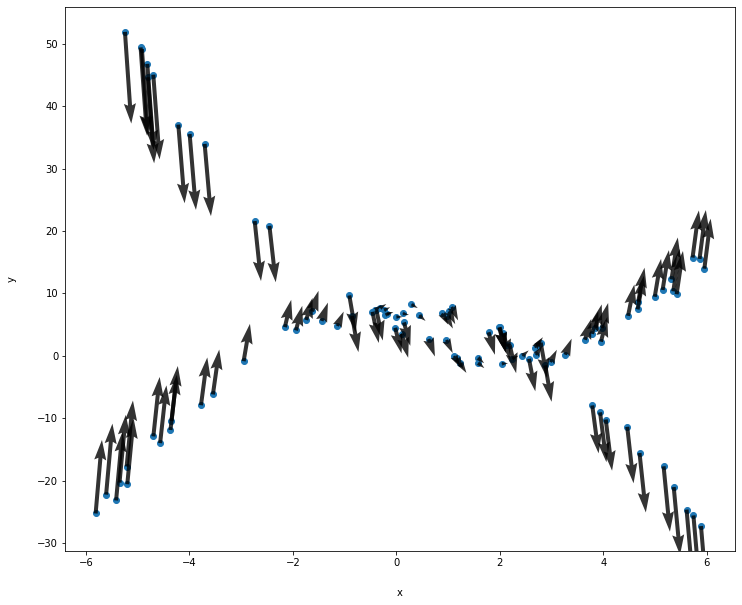

In [ ]:
plot_moons(X, X_, 0)